In [1]:
import mujoco
import mujoco_viewer
import copy as cp
import matplotlib.pyplot as plt
#from control.mppi_gait import MPPI
import numpy as np

In [2]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [3]:
import os

In [4]:
from control.gait_scheduler.gait_controller import Controller
from control.gait_scheduler.config import Configuration
from control.gait_scheduler.kinematics import inverse_kinematics
from control.gait_scheduler.utils import Command, State, BehaviorState

In [5]:
model_sim = mujoco.MjModel.from_xml_path("models/go1/go1_scene_mppi.xml")

In [6]:
model_sim.actuator('FR_hip').biasprm

array([  0., -50.,  -3.,   0.,   0.,   0.,   0.,   0.,   0.,   0.])

In [7]:
model_sim.actuator('FL_calf').gainprm

array([50.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

In [8]:
dt_sim = 0.01
model_sim.opt.timestep = dt_sim
data_sim = mujoco.MjData(model_sim)

In [9]:
viewer = mujoco_viewer.MujocoViewer(model_sim, data_sim, 'offscreen')

In [10]:
# reset robot (keyframes are defined in the xml)
mujoco.mj_resetDataKeyframe(model_sim, data_sim, 0) # stand position
mujoco.mj_forward(model_sim, data_sim)
q_init = cp.deepcopy(data_sim.qpos) # save reference pose
v_init = cp.deepcopy(data_sim.qvel) # save reference pose

In [11]:
print("Configuration: {}".format(q_init)) # save reference pose

Configuration: [ 0.    0.    0.26  1.    0.    0.    0.    0.    0.9  -1.8   0.    0.9
 -1.8   0.    0.9  -1.8   0.    0.9  -1.8 ]


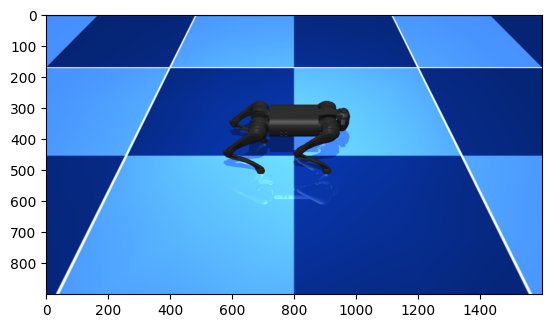

In [12]:
img = viewer.read_pixels()
plt.imshow(img)

In [13]:
config = Configuration()

In [14]:
controller = Controller(config, inverse_kinematics)

In [15]:
command = Command()
state = State()

In [16]:
command.horizontal_velocity = np.array([0.0, 0])
command.trot_event = True

state.behavior_state = BehaviorState.REST
state.quat_orientation = np.array([1,0,0,0]) # np.array([0.9397,-0.3420,0,0])

In [17]:
controller.set_pose_to_default(state)

In [18]:
state.foot_locations

array([[ 0.1881 ,  0.1881 , -0.1881 , -0.1881 ],
       [-0.12675,  0.12675, -0.12675,  0.12675],
       [-0.27   , -0.27   , -0.27   , -0.27   ]])

In [19]:
state.joint_angles

array([[ 0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.88433655,  0.88433655,  0.88433655,  0.88433655],
       [-1.7686731 , -1.7686731 , -1.7686731 , -1.7686731 ]])

In [20]:
gait_joints_sequence = []
gait_joints_sequence.append(state.joint_angles.flatten(order='F'))
for i in range(config.phase_length-1):
    controller.run(state, command)
    gait_joints_sequence.append(state.joint_angles.flatten(order='F'))

In [21]:
data_sim.qpos[0:3]

array([0.  , 0.  , 0.26])

In [22]:
data_sim.qpos[3:7] = state.quat_orientation
data_sim.qpos[7:] =  gait_joints_sequence[0]

In [23]:
%%time
anim_imgs = []
sim_inputs = []
for ticks in range(config.phase_length):
    #print(ticks)
    q_curr = cp.deepcopy(data_sim.qpos) # save reference pose
    v_curr = cp.deepcopy(data_sim.qvel) # save reference pose
    u_joints = gait_joints_sequence[ticks]
    data_sim.qpos[7:] = u_joints
    mujoco.mj_forward(model_sim, data_sim)
    img = viewer.read_pixels()
    anim_imgs.append(1*img)

CPU times: user 46.3 ms, sys: 78 ms, total: 124 ms
Wall time: 125 ms


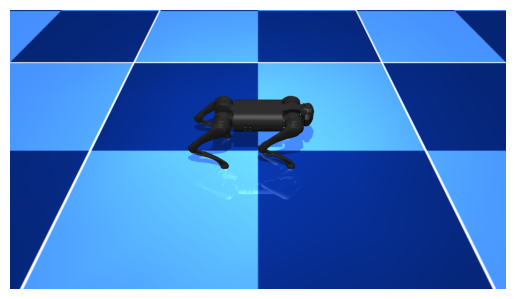

In [24]:
fig, ax = plt.subplots()
skip_frames = 1
interval = dt_sim*1000*skip_frames

def animate(i):
    ax.clear()
    ax.imshow(anim_imgs[i * skip_frames])  # Display the image, skipping frames
    ax.axis('off')

# Create animation, considering the reduced frame rate due to skipped frames
ani = FuncAnimation(fig, animate, frames=len(anim_imgs) // skip_frames, interval=interval)  # 50 ms for 20 Hz

# Display the animation
HTML(ani.to_jshtml())

In [25]:
model_sim.name_jntadr

array([122, 123, 136, 151, 165, 178, 193, 207, 220, 235, 249, 262, 277],
      dtype=int32)

In [26]:
model_sim.name_actuatoradr

array([624, 631, 640, 648, 655, 664, 672, 679, 688, 696, 703, 712],
      dtype=int32)

In [27]:
model_sim.names

b'Quadruped Go1\x00world\x00trunk\x00FR_hip\x00FR_thigh\x00FR_calf\x00FL_hip\x00FL_thigh\x00FL_calf\x00RR_hip\x00RR_thigh\x00RR_calf\x00RL_hip\x00RL_thigh\x00RL_calf\x00\x00FR_hip_joint\x00FR_thigh_joint\x00FR_calf_joint\x00FL_hip_joint\x00FL_thigh_joint\x00FL_calf_joint\x00RR_hip_joint\x00RR_thigh_joint\x00RR_calf_joint\x00RL_hip_joint\x00RL_thigh_joint\x00RL_calf_joint\x00floor\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00FR\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00FL\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00RR\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00RL\x00head\x00imu\x00FR\x00FL\x00RR\x00RL\x00tracking\x00\x00spotlight\x00trunk\x00hip\x00thigh_mirror\x00calf\x00thigh\x00blue_grid\x00grey_grid\x00skybox\x00blue_grid\x00grey_grid\x00self\x00self_default\x00self_highlight\x00effector\x00effector_default\x00effector_highlight\x00decoration\x00eye\x00target\x00target_default\x00target_highlight\x00site\x00dark\x00FR_hip\x00FR_thigh\x00FR_c

In [28]:
model_sim.njnt

13

In [29]:
def get_joint_names(model):
    names = []
    for i in range(model.njnt-1):
        name_adr = model.name_jntadr[i+1]
        name = model.names[name_adr:].split(b'\x00', 1)[0].decode('utf-8')
        names.append(name)
    return names

In [30]:
# Get actuator names
joint_names = get_joint_names(model_sim)

# Print actuator names
for name in joint_names:
    print(name)

FR_hip_joint
FR_thigh_joint
FR_calf_joint
FL_hip_joint
FL_thigh_joint
FL_calf_joint
RR_hip_joint
RR_thigh_joint
RR_calf_joint
RL_hip_joint
RL_thigh_joint
RL_calf_joint


In [31]:
def get_actuator_names(model):
    names = []
    for i in range(model.nu):
        name_adr = model.name_actuatoradr[i]
        name = model.names[name_adr:].split(b'\x00', 1)[0].decode('utf-8')
        names.append(name)
    return names

# Get actuator names
actuator_names = get_actuator_names(model_sim)

# Print actuator names
for name in actuator_names:
    print(name)

FR_hip
FR_thigh
FR_calf
FL_hip
FL_thigh
FL_calf
RR_hip
RR_thigh
RR_calf
RL_hip
RL_thigh
RL_calf


In [32]:
# reset robot (keyframes are defined in the xml)
mujoco.mj_resetDataKeyframe(model_sim, data_sim, 0) # stand position
mujoco.mj_forward(model_sim, data_sim)
q_ref_mj = cp.deepcopy(data_sim.qpos) # save reference pose
v_ref_mj = cp.deepcopy(data_sim.qvel) # save reference pose

In [33]:
print("Configuration: {}".format(q_ref_mj)) # save reference pose

Configuration: [ 0.    0.    0.26  1.    0.    0.    0.    0.    0.9  -1.8   0.    0.9
 -1.8   0.    0.9  -1.8   0.    0.9  -1.8 ]


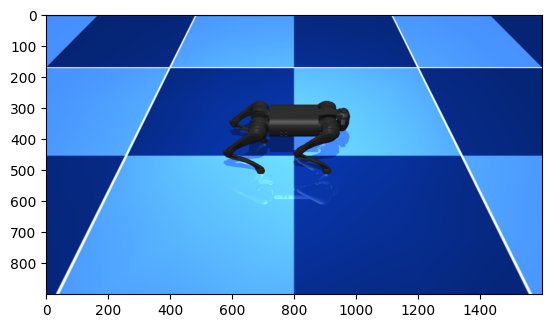

In [34]:
img = viewer.read_pixels()
plt.imshow(img)

## Controller Modifications

In [35]:
import os
import yaml

import numpy as np
from scipy.interpolate import CubicSpline

import mujoco
from mujoco import rollout

import concurrent.futures
import threading
from concurrent.futures import ThreadPoolExecutor

In [36]:
class GaitScheduler:
    def __init__(self, gait_path = 'gaits/walking_gait_raibert_0_2.tsv', phase_time = 0):
        # Load the configuration file
        with open(gait_path, 'r') as file:
            gait_array = np.loadtxt(file, delimiter='\t')
        
        # Load model
        self.gait = gait_array
        self.phase_length = gait_array.shape[1]
        self.phase_time = phase_time
        self.indices = np.arange(self.phase_length)
        
    def roll(self):
        self.phase_time += 1
        self.indices = np.roll(self.indices, -1)
    
    def get_current_ref(self):
        return self.gait[:, self.phase_time] 

In [37]:
# class GaitScheduler:
#     def __init__(self, phase_time=0):
#         # Load model
#         self.gait_config = Configuration()
#         self.command = Command()
#         self.state = State()
        
#         # Set commands
#         self.state.behavior_state = BehaviorState.TROT
#         self.state.quat_orientation = np.array([1,0,0,0])
        
#         self.phase_length = self.gait_config.phase_length
#         self.phase_time = phase_time
#         self.indices = np.arange(self.phase_length)

#     def generate_gait(self):
        
        
#     def roll(self):
#         self.phase_time += 1
#         self.indices = np.roll(self.indices, -1)
    
#     def get_current_ref(self):
#         return self.gait[:, self.phase_time] 

In [38]:
def batch_world_to_local_velocity(quaternions, world_velocities):
    """
    Transforms a batch of world frame velocities to local body frame using quaternion orientations.
    
    Parameters:
    quaternions (np.array): Array of shape (t, 4) where each quaternion is [q_w, q_x, q_y, q_z]
    world_velocities (np.array): Array of shape (t, 3) where each velocity is [v_x, v_y, v_z]
    
    Returns:
    local_velocities (np.array): Array of shape (t, 3) with local body frame velocities
    """
    # Create a rotation object from the batch of quaternions (scipy expects [q_x, q_y, q_z, q_w])
    rotation = R.from_quat(quaternions[:, [1, 2, 3, 0]])  # Reordering to [q_x, q_y, q_z, q_w]
    
    # Apply the inverse rotation to each velocity vector in the batch
    local_velocities = rotation.inv().apply(world_velocities)
    return local_velocities

In [39]:
def batch_local_velocity_to_world(quaternions, local_velocities):
    """
    Transforms a batch of local frame velocities to global frame using quaternion orientations.
    
    Parameters:
    quaternions (np.array): Array of shape (t, 4) where each quaternion is [q_w, q_x, q_y, q_z]
    world_velocities (np.array): Array of shape (t, 3) where each velocity is [v_x, v_y, v_z]
    
    Returns:
    global_velocities (np.array): Array of shape (t, 3) with global body frame velocities
    """
    # Create a rotation object from the batch of quaternions (scipy expects [q_x, q_y, q_z, q_w])
    rotation = R.from_quat(quaternions[:, [1, 2, 3, 0]])  # Reordering to [q_x, q_y, q_z, q_w]
    
    # Apply the inverse rotation to each velocity vector in the batch
    world_velocities = rotation.apply(local_velocities)
    return world_velocities

In [40]:
class MPPI:
    def __init__(self, model_path = os.path.join("models/go1/go1_scene_mppi.xml"),
                 config_path=os.path.join("control/configs/mppi_gait_config_walk.yml")) -> None:
        
        # load the configuration file
        with open(config_path, 'r') as file:
            params = yaml.safe_load(file)

        self.internal_ref = False

        # Load model
        self.model = mujoco.MjModel.from_xml_path(model_path)
        self.model.opt.timestep = params['dt']
        self.model.opt.enableflags = 1 # to override contact settings
        self.model.opt.o_solref = np.array(params['o_solref'])

        # MPPI controller configuration
        self.temperature = params['lambda']
        self.horizon = params['horizon']
        self.n_samples = params['n_samples']
        self.noise_sigma = np.array(params['noise_sigma'])
        self.num_workers = params['n_workers']
        self.sampling_init = np.array([-0.3,  1.34, -2.83,  
                                       0.3,  1.34, -2.83,  
                                       -0.3,  1.34, -2.83,  
                                       0.3,  1.34, -2.83])
        
        # Cost
        self.Q = np.diag(np.array(params['Q_diag']))
        self.R = np.diag(np.array(params['R_diag']))
        self.x_ref = np.concatenate([np.array(params['q_ref']), np.array(params['v_ref'])])
        self.q_ref = np.array(params['q_ref'])
        self.v_ref = np.array(params['v_ref'])
        
        # Threding
        self.thread_local = threading.local()   
        self.executor = ThreadPoolExecutor(max_workers=self.num_workers, initializer=self.thread_initializer)

        # Get env parameters
        self.act_dim = 12
        self.act_max = np.array([0.863, 4.501, -0.888]*4)
        self.act_min = np.array([-0.863, -0.686, -2.818]*4)
        
        # Gait scheduler
        self.gait_scheduler = GaitScheduler()
        self.joints_ref = None
        #self.x_ref = jnp.concatenate([jnp.array(params['q_ref']), jnp.array(params['v_ref'])])
        
        # Rollouts
        self.h = params['dt']
        self.sample_type = params['sample_type']
        self.n_knots = params['n_knots']
        self.random_generator = np.random.default_rng(params["seed"])
        
        self.rollout_func = self.threaded_rollout
        self.cost_func = self.calculate_total_cost
        self.state_rollouts = np.zeros((self.n_samples, self.horizon, mujoco.mj_stateSize(self.model, mujoco.mjtState.mjSTATE_FULLPHYSICS.value)))
            
        self.trajectory = None
        self.reset_planner() 
        self.goal_pos = [[1, 0, 0.27],
                         [2, 1, 0.27],
                         [2, 2, 0.27],
                         [1, 3, 0.27],
                         [0, 3, 0.27], 
                         [-1, 2, 0.27], 
                         [-1, 1, 0.27],
                         [0, 0, 0.27]]
                        
        #self.goal_pos = [[1, 0, 0.57]]
        # self.goal_pos = [[1, 0, 0.4],
        #                  [2, 1, 0.4],
        #                  [2, 2, 0.4],
        #                  [1, 3, 0.4],
        #                  [0, 3, 0.4], 
        #                  [-1, 2, 0.4], 
        #                  [-1, 1, 0.4],
        #                  [0, 0, 0.4]]
        
        self.goal_ori = [[1, 0, 0, 0]]
                         # #[0.819,-0.177,0.427,0.339], 
                         # [0.92388, 0, 0, 0.38268],
                         # [0.7071, 0, 0, 0.7071], 
                         # [0.38268, 0, 0, 0.92388],
                         # [0, 0, 0, 1],
                         # [-0.38268, 0, 0, 0.92388],
                         # [-0.7071, 0, 0, 0.7071],
                         # [-0.92388, 0, 0, 0.38268]]
        # self.goal_pos = [[1, 0, 0.67]]
        
        # self.goal_ori = [[1, 0, 0, 0]]

        self.goal_index = 0
        self.cmd_vel = np.array([0.2, 0])
        self.body_ref = np.concatenate((self.goal_pos[self.goal_index], 
                                        self.goal_ori[self.goal_index],
                                        self.cmd_vel,
                                        np.zeros(4)))

    def next_goal(self):
        self.goal_index = (self.goal_index + 1) % len(self.goal_pos)
        self.body_ref[:3] = self.goal_pos[self.goal_index] 
        
    #np.concatenate((self.goal_pos[self.goal_index], self.goal_ori[self.goal_index], self.cmd_vel, np.zeros(4)))
                
    def reset_planner(self):
        self.trajectory = np.zeros((self.horizon, self.act_dim))
        self.trajectory += self.sampling_init
            
    def generate_noise(self, size):
        return self.random_generator.normal(size=size) * self.noise_sigma
    
    def sample_delta_u(self):
        if self.sample_type == 'normal':
            size = (self.n_samples, self.horizon, self.act_dim)
            return self.generate_noise(size)
        elif self.sample_type == 'cubic':
            indices = np.arange(self.n_knots)*self.horizon//self.n_knots
            size = (self.n_samples, self.n_knots, self.act_dim)
            knot_points = self.generate_noise(size)
            cubic_spline = CubicSpline(indices, knot_points, axis=1)
            return cubic_spline(np.arange(self.horizon))
        
    def perturb_action(self):
        if self.sample_type == 'normal':
            size = (self.n_samples, self.horizon, self.act_dim)
            actions = self.trajectory + self.generate_noise(size)
            actions = np.clip(actions, self.act_min, self.act_max)
            return actions
        
        elif self.sample_type == 'cubic':
            indices_float = np.linspace(0, self.horizon - 1, num=self.n_knots)
            indices = np.round(indices_float).astype(int)
            size = (self.n_samples, self.n_knots, self.act_dim)
            noise = self.generate_noise(size)
            knot_points = self.trajectory[indices] + noise
            #knot_points[:, 0, :] = self.trajectory[0]
            cubic_spline = CubicSpline(indices, knot_points, axis=1)
            actions = cubic_spline(np.arange(self.horizon))
            actions = np.clip(actions, self.act_min, self.act_max)
            return actions
        
    def update(self, obs): 
        actions = self.perturb_action()
        self.obs = obs
        direction = self.body_ref[:3] - obs[:3]
        goal_delta = np.linalg.norm(direction)
        
        if (goal_delta > 0.1): 
            self.goal_ori = calculate_orientation_quaternion(obs[:3], self.body_ref[:3])

        # print("Curernt Position",  obs[:3])
        # print("Desired Position",  self.body_ref[:3])
        # print("Orientation", orientation_goal)
        self.body_ref[3:7] = self.goal_ori
        self.rollout_func(self.state_rollouts, actions, np.repeat(np.array([np.concatenate([[0],obs])]), self.n_samples, axis=0), num_workers=self.num_workers, nstep=self.horizon)
        #states, actions, phase_time, joints_gait, body_ref
        
        if self.internal_ref:
            #print("Updating reference")
            self.joints_ref = self.gait_scheduler.gait[:, self.gait_scheduler.indices[:self.horizon]]
            
        costs_sum = self.cost_func(self.state_rollouts[:,:,1:], actions, 
                                   self.joints_ref, self.body_ref)
        
        self.gait_scheduler.roll()
        # MPPI weights calculation
        ## Scale parameters
        min_cost = np.min(costs_sum)
        max_cost = np.max(costs_sum)
        
        exp_weights = np.exp(-1/self.temperature * ((costs_sum - min_cost)/(max_cost - min_cost)))
        weighted_delta_u = exp_weights.reshape(self.n_samples, 1, 1) * actions
        weighted_delta_u = np.sum(weighted_delta_u, axis=0) / (np.sum(exp_weights) + 1e-10)
        updated_actions = np.clip(weighted_delta_u, self.act_min, self.act_max)
    
        # Pop out first action from the trajectory and repeat last action
        self.trajectory = np.roll(updated_actions, shift=-1, axis=0)
        self.trajectory[-1] = updated_actions[-1]

        # Output first action (MPC)
        action = updated_actions[0] 
        return action
    
    def shutdown(self):
        self.executor.shutdown(wait=True)

    def thread_initializer(self):
        self.thread_local.data = mujoco.MjData(self.model)

    def call_rollout(self, initial_state, ctrl, state):
        rollout.rollout(self.model, self.thread_local.data, skip_checks=True,
                        nroll=state.shape[0], nstep=state.shape[1],
                        initial_state=initial_state, control=ctrl, state=state)

    def threaded_rollout(self, state, ctrl, initial_state, num_workers=32, nstep=5):
        n = len(initial_state) // num_workers
        # Use list comprehension to create chunks for all workers
        chunks = [(initial_state[i*n:(i+1)*n], ctrl[i*n:(i+1)*n], state[i*n:(i+1)*n]) for i in range(num_workers-1)]
        # Add the last chunk, which includes any remainder
        chunks.append((initial_state[(num_workers-1)*n:], ctrl[(num_workers-1)*n:], state[(num_workers-1)*n:]))

        futures = [self.executor.submit(self.call_rollout, *chunk) for chunk in chunks]
        for future in concurrent.futures.as_completed(futures):
            future.result()
    
    def quaternion_distance_np(self, q1, q2):
        dot_products = np.einsum('ij,ij->i', q1, q2)
        return 1 - np.abs(dot_products)

    def quadruped_cost_np(self, x, u, x_ref):
        kp = 50
        kd = 3
        
        # Compute the error terms
        x_error = x - x_ref
        
        q_dist = self.quaternion_distance_np(x[:, 3:7], x_ref[:, 3:7])
        x_error[:, 3] = q_dist
        x_error[:, 4] = q_dist
        x_error[:, 5] = q_dist
        x_error[:, 6] = q_dist

        x_joint = x[:, 7:19]
        v_joint = x[:, 25:]
        u_error = kp * (u - x_joint) - kd * v_joint

        # Compute cost using einsum for precise matrix operations
        # Apply the matrix Q to x_error and R to u_error, sum over appropriate dimensions
        x_error[:, :3] = 0
        x_pos_error = x[:,:3] - x_ref[:,:3]
        L1_norm_pos_cost = np.abs(np.dot(x_pos_error, self.Q[:3,:3])).sum(axis=1)
        #L1_norm_pos_cost = 0

        cost = np.einsum('ij,ik,jk->i', x_error, x_error, self.Q) + np.einsum('ij,ik,jk->i', u_error, u_error, self.R) + L1_norm_pos_cost
        return cost

    def calculate_total_cost(self, states, actions, joints_ref, body_ref):
        num_samples = states.shape[0]
        num_pairs = states.shape[1]

        traj_body_ref = np.repeat(body_ref[np.newaxis,:], num_samples*num_pairs, axis=0)

        # Flatten states and actions to two dimensions, treating all pairs per sample as a batch
        states = states.reshape(-1, states.shape[2])
        actions = actions.reshape(-1, actions.shape[2])

        joints_ref = joints_ref.T
        joints_ref = np.tile(joints_ref, (num_samples, 1, 1))
        joints_ref = joints_ref.reshape(-1, joints_ref.shape[2])

        # rotated_ref = batch_local_velocity_to_world(traj_body_ref[:,3:7], traj_body_ref[:,7:10])
        # x_ref = np.concatenate([traj_body_ref[:,:7], 
        #                         joints_ref[:,:12], 
        #                         rotated_ref, traj_body_ref[:,10:], 
        #                         joints_ref[:,12:]], 
        #                         axis=1)
        # rotated_ref = batch_local_velocity_to_world(traj_body_ref[:,3:7], traj_body_ref[:,7:10])
        
        x_ref = np.concatenate([traj_body_ref[:,:7], joints_ref[:,:12], 
                                traj_body_ref[:,7:], joints_ref[:,12:]], 
                                axis=1)
        # Compute batch costs
        rotated_ref = batch_world_to_local_velocity(states[:,3:7], states[:,19:22])
        states[:,19:22] = rotated_ref
        costs = self.quadruped_cost_np(states, actions, x_ref)
        # Sum costs for each sample
        total_costs = costs.reshape(num_samples, num_pairs).sum(axis=1)
        return total_costs
    
    def __del__(self):
        self.shutdown()

In [41]:
from scipy.spatial.transform import Rotation as R

def world_to_local_velocity(quaternion, world_velocity):
    """
    Transforms world frame velocities to local body frame using quaternion orientation.
    
    Parameters:
    quaternion (list or array): Quaternion representing the orientation [q_w, q_x, q_y, q_z]
    world_velocity (list or array): World frame velocity [v_x, v_y, v_z]
    
    Returns:
    local_velocity (np.array): Transformed local body frame velocity [v_x_body, v_y_body, v_z_body]
    """
    # Create a rotation object from the quaternion (scipy expects [q_x, q_y, q_z, q_w])
    rotation = R.from_quat([quaternion[1], quaternion[2], quaternion[3], quaternion[0]])
    
    # Rotate the world velocity into the local frame using the inverse of the rotation
    local_velocity = rotation.inv().apply(world_velocity)
    
    return local_velocity

In [42]:
def calculate_orientation_quaternion(current_point, goal_point):
    """
    Calculates the orientation quaternion that points from the current point to the goal point
    with counterclockwise rotations around the z-axis (yaw) and y-axis (pitch).
    
    Parameters:
    current_point (np.array): The current position as [x, y, z].
    goal_point (np.array): The goal position as [x, y, z].
    
    Returns:
    quaternion (np.array): The orientation quaternion [q_w, q_x, q_y, q_z].
    """
    
    # Calculate the direction vector from the current point to the goal point
    direction = goal_point - current_point
    length = np.linalg.norm(direction)
    #print("Error: ", length)
    direction_normalized = direction / length
    
    # Calculate yaw (rotation around the z-axis)
    yaw = np.arctan2(direction_normalized[1], direction_normalized[0])
    
    # Calculate pitch (rotation around the y-axis)
    pitch = -np.arctan2(direction_normalized[2], np.sqrt(direction_normalized[0]**2 + direction_normalized[1]**2))
    
    # Convert yaw and pitch to quaternions
    yaw_quat = R.from_euler('z', yaw).as_quat()  # Yaw quaternion
    pitch_quat = R.from_euler('y', pitch).as_quat()  # Pitch quaternion
    
    # Combine the quaternions by multiplying them
    combined_rotation = R.from_quat(yaw_quat) * R.from_quat(pitch_quat)
    quaternion = combined_rotation.as_quat()
    
    # Reorder the quaternion to [q_w, q_x, q_y, q_z]
    quaternion = np.array([quaternion[3], quaternion[0], quaternion[1], quaternion[2]])
    
    return quaternion

In [43]:
controller = MPPI()
controller.internal_ref = True
controller.reset_planner()

In [44]:
q_curr = cp.deepcopy(data_sim.qpos) # save reference pose
v_curr = cp.deepcopy(data_sim.qvel) # save reference pose
x = np.concatenate([q_curr, v_curr])

In [45]:
%%time
controller.update(x)

CPU times: user 79.5 ms, sys: 2.85 ms, total: 82.3 ms
Wall time: 20.8 ms


array([-0.31919428,  1.23284156, -2.758716  ,  0.28611562,  1.30957241,
       -2.78900084, -0.34577679,  1.35706094, -2.80790819,  0.29831095,
        1.35522741, -2.74397218])

In [46]:
controller.reset_planner()

In [47]:
tfinal = 10
tvec = np.linspace(0,tfinal,int(np.ceil(tfinal/dt_sim))+1)

In [48]:
mujoco.mj_resetDataKeyframe(model_sim, data_sim, 1)
mujoco.mj_forward(model_sim, data_sim)

In [49]:
viewer.cam.distance = 4.0

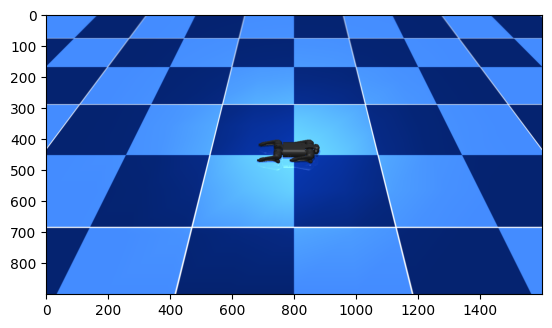

In [50]:
img = viewer.read_pixels()
plt.imshow(img)

In [51]:
%%time
anim_imgs = []
sim_inputs = []
x_states = []
for ticks, ti in enumerate(tvec):
    q_curr = cp.deepcopy(data_sim.qpos) # save reference pose
    v_curr = cp.deepcopy(data_sim.qvel) # save reference pose
    x = np.concatenate([q_curr, v_curr])
    
    if ticks%1 == 0:
        u_joints = controller.update(x)  
        
    data_sim.ctrl[:] = u_joints
    mujoco.mj_step(model_sim, data_sim)
    mujoco.mj_forward(model_sim, data_sim)

    error = np.linalg.norm(np.array(controller.body_ref[:3]) - np.array(data_sim.qpos[:3]))
    if error < 0.2:
        controller.next_goal()
        
    viewer.add_marker(
        pos=controller.body_ref[:3],         # Position of the marker
        size=[0.15, 0.15, 0.15],     # Size of the sphere
        rgba=[1, 0, 1, 1],           # Color of the sphere (red)
        type=mujoco.mjtGeom.mjGEOM_SPHERE, # Specify that this is a sphere
        label=""
    )
    
    #print(controller.body_ref)
    img = viewer.read_pixels()
    anim_imgs.append(img)
    sim_inputs.append(u_joints)
    x_states.append(x)

CPU times: user 1min 3s, sys: 4.5 s, total: 1min 8s
Wall time: 23.6 s


In [52]:
calculate_orientation_quaternion(np.array([1.1,3,0.26]), np.array([0, 3, 0.27]))

array([ 6.12317074e-17,  4.54531368e-03, -2.78320193e-19,  9.99989670e-01])

In [53]:
x_states_np = np.array(x_states)

In [54]:
x_states_np.shape

(1001, 37)

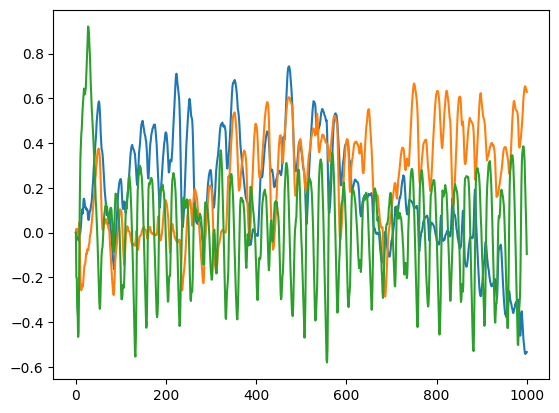

In [55]:
plt.plot(x_states_np[:,19:22])

In [56]:
orientations = x_states_np[:,3:7]
velocities = x_states_np[:,19:22]

In [57]:
velocities_trans = batch_world_to_local_velocity(orientations, velocities)

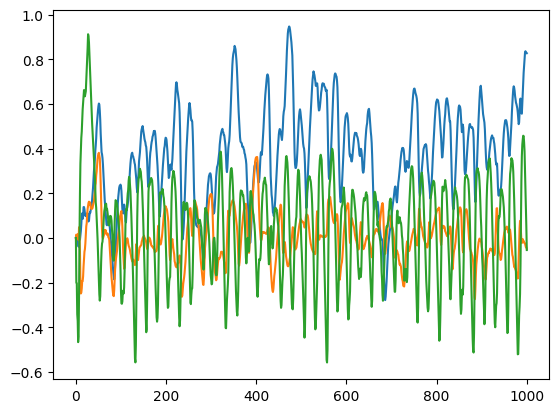

In [58]:
plt.plot(velocities_trans)

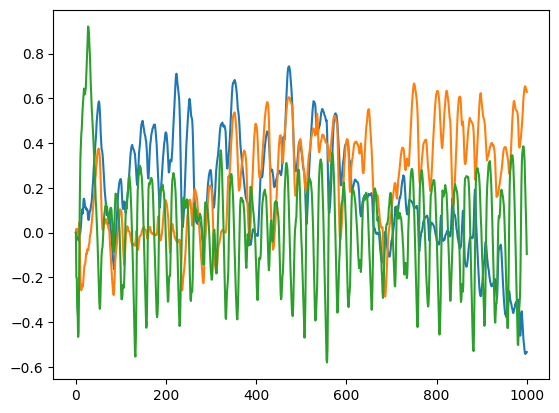

In [59]:
plt.plot(x_states_np[:,19:22])

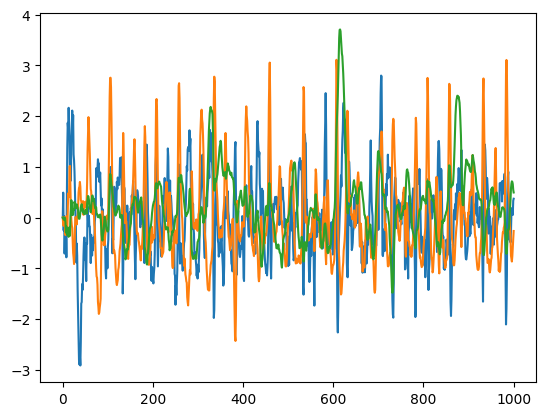

In [60]:
plt.plot(x_states_np[:,22:25])

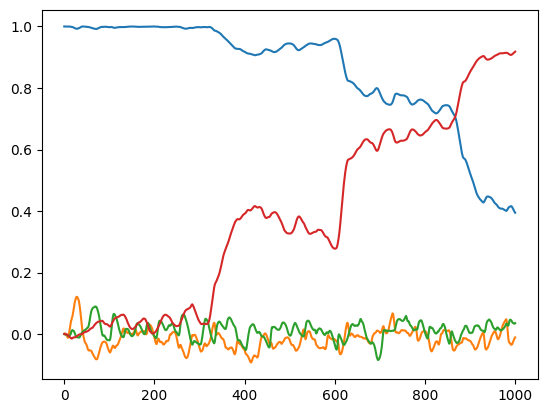

In [61]:
plt.plot(x_states_np[:,3:7])

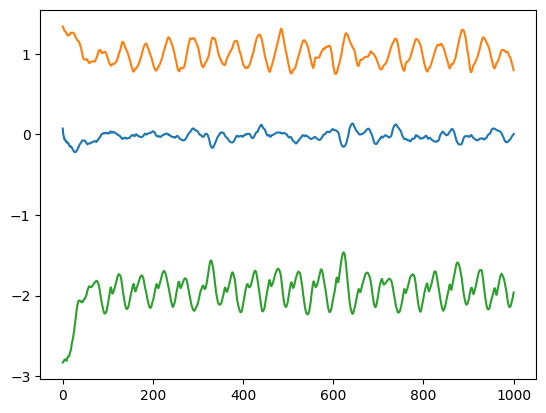

In [62]:
plt.plot(x_states_np[:,7:10])

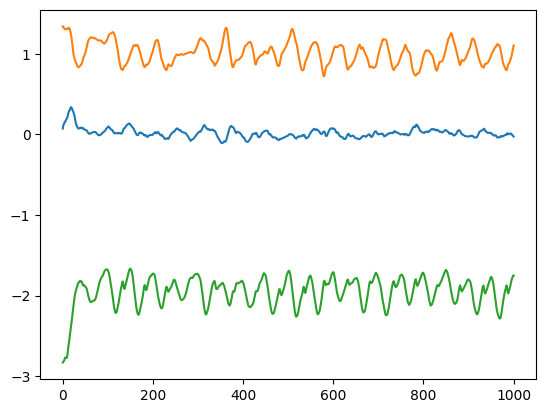

In [63]:
plt.plot(x_states_np[:,10:13])

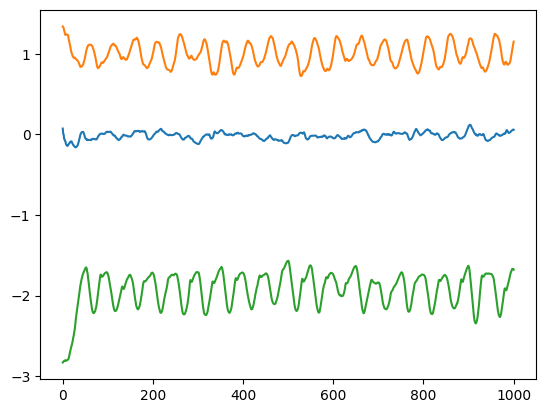

In [64]:
plt.plot(x_states_np[:,13:16])

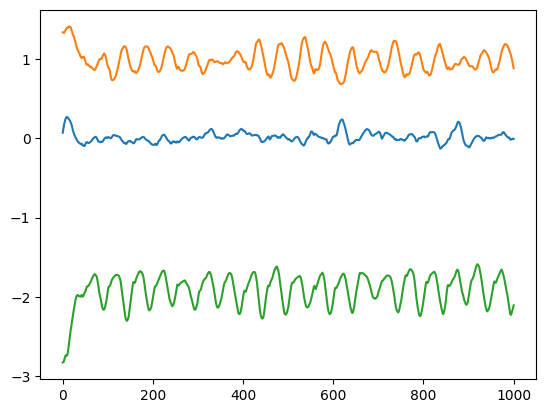

In [65]:
plt.plot(x_states_np[:,16:19])

In [66]:
sim_inputs_np = np.array(sim_inputs)

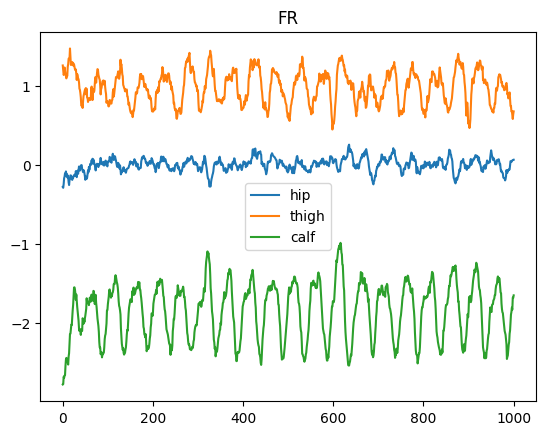

In [67]:
plt.plot(sim_inputs_np[:,0:3], label=["hip", "thigh", "calf"])
plt.title("FR")
plt.legend()

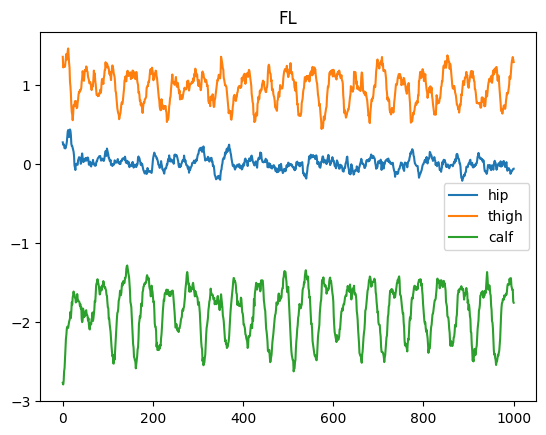

In [68]:
plt.plot(sim_inputs_np[:,3:6], label=["hip", "thigh", "calf"])
plt.title("FL")
plt.legend()

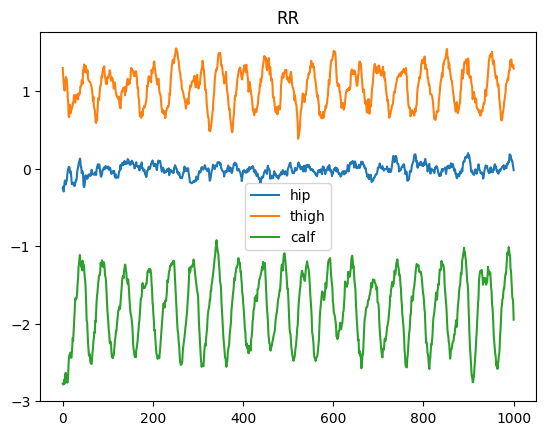

In [69]:
plt.plot(sim_inputs_np[:,6:9], label=["hip", "thigh", "calf"])
plt.title("RR")
plt.legend()

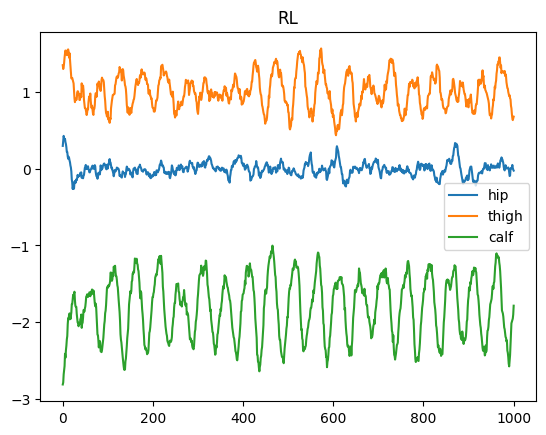

In [70]:
plt.plot(sim_inputs_np[:,9:], label=["hip", "thigh", "calf"])
plt.title("RL")
plt.legend()

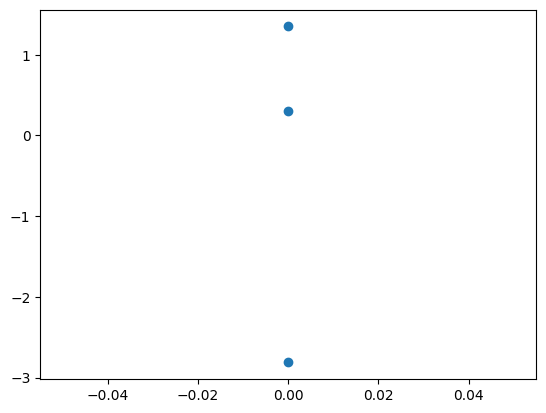

In [71]:
plt.scatter((0,0,0), sim_inputs_np[0,9:12])

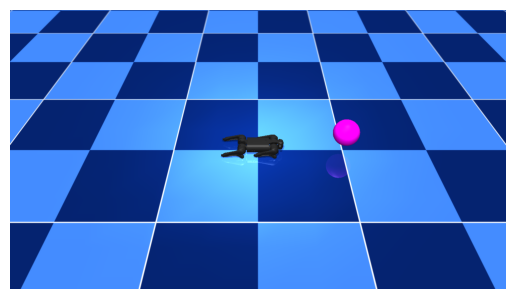

In [72]:
fig, ax = plt.subplots()
skip_frames = 5
interval = dt_sim*1000*skip_frames

def animate(i):
    ax.clear()
    ax.imshow(anim_imgs[i * skip_frames])  # Display the image, skipping frames
    ax.axis('off')

# Create animation, considering the reduced frame rate due to skipped frames
ani = FuncAnimation(fig, animate, frames=len(anim_imgs) // skip_frames, interval=interval)  # 50 ms for 20 Hz

# Display the animation
HTML(ani.to_jshtml())

In [73]:
# np.savetxt('mujoco_logs/walking_straight.tsv', sim_inputs_np, delimiter='\t')